In [2]:
import PIL
import glob
import time
import pickle
import random
import matplotlib
import numpy as np
from PIL import Image
from tqdm import tqdm, notebook
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
%matplotlib inline

Let's start by loading the pickle files that we saved from our previous notebook.

In [3]:
filenames = pickle.load(open('data/filenames-caltech101.pickle', 'rb'))
feature_list = pickle.load(open('data/features-caltech101-resnet.pickle', 'rb'))
class_ids = pickle.load(open('data/class_ids-caltech101.pickle', 'rb'))

In [4]:
num_images = len(filenames)
num_features_per_image = len(feature_list[0])
print('Number of images = ', num_images)
print('Number of features per image = ', num_features_per_image)

Number of images =  8677
Number of features per image =  2048


In [5]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)

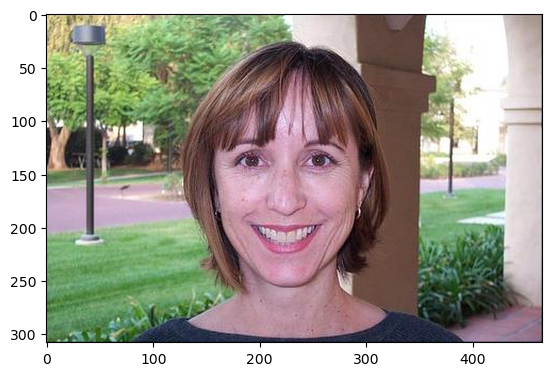

In [6]:
random_index = 75
distances, indices = neighbors.kneighbors([feature_list[random_index]])
plt.imshow(mpimg.imread(filenames[random_index]), interpolation='lanczos')

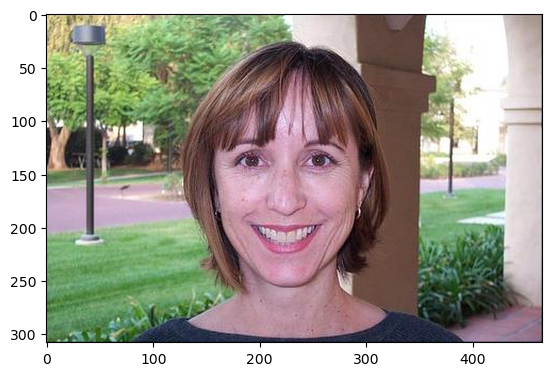

In [7]:
plt.imshow(mpimg.imread(filenames[indices[0][0]]), interpolation='lanczos')

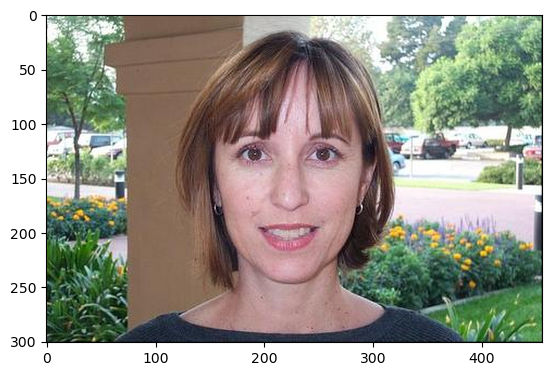

In [8]:
plt.imshow(mpimg.imread(filenames[indices[0][1]]), interpolation='lanczos')

In [9]:
for i in range(5):
    print(distances[0][i])

3.650024149988857e-08
0.5209802483935029
0.5327969076162815
0.5463873732821146
0.5810481736274852


# Experiments

Now, lets start our experiments

In [10]:
def classname(str):
    return str.split('/')[-2]

def classname_filename(str):
    return str.split('/')[-2] + '/' + str.split('/')[-1]

def plot_images(filenames, distances):
    images = []
    for filename in filenames:
        images.append(mpimg.imread(filename))
    plt.figure(figsize=(20,10))
    columns = 4
    for i, image in enumerate(images):
        ax = plt.subplot(len(images) / columns + 1, columns, i + 1)
        if i == 0:
            ax.set_title('Query Image\n' + classname_filename(filenames[i]))
        else:
            ax.set_title('Similar Image\n' + classname_filename(filenames[i]) + '\nDistance = ' + str(distances[i]))
        plt.imshow(image)

In [11]:
neighbors = NearestNeighbors(n_neighbors=len(feature_list),
                             algorithm='brute',
                             metric='euclidean').fit(feature_list)
distances, indices = neighbors.kneighbors(feature_list)

# Calculating some stats
print("Median distance between all photos: ", np.median(distances))
print("Max distance between all photos: ", np.max(distances))
print("Median distance among most similar photos: ", np.median(distances[:, 2]))

Median distance between all photos:  1.0035910501195828
Max distance between all photos:  1.2514240736018931
Median distance among most similar photos:  0.6583083886438547


Here we are selecting the first 1000 images.

In [12]:
selected_features = feature_list[:]
selected_class_ids = class_ids[:]
selected_filenames = filenames[:]

In [13]:
from sklearn.manifold import TSNE

n_components = 2
verbose = 1
perplexity = 30
n_iter = 1000
metric = 'euclidean'

time_start = time.time()
tsne_results = TSNE(n_components=n_components,
                    verbose=verbose,
                    perplexity=perplexity,
                    n_iter=n_iter,
                    metric=metric).fit_transform(selected_features)

print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8677 samples in 0.004s...
[t-SNE] Computed neighbors for 8677 samples in 1.599s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8677
[t-SNE] Computed conditional probabilities for sample 2000 / 8677
[t-SNE] Computed conditional probabilities for sample 3000 / 8677
[t-SNE] Computed conditional probabilities for sample 4000 / 8677
[t-SNE] Computed conditional probabilities for sample 5000 / 8677
[t-SNE] Computed conditional probabilities for sample 6000 / 8677
[t-SNE] Computed conditional probabilities for sample 7000 / 8677
[t-SNE] Computed conditional probabilities for sample 8000 / 8677
[t-SNE] Computed conditional probabilities for sample 8677 / 8677
[t-SNE] Mean sigma: 0.196560
[t-SNE] KL divergence after 250 iterations with early exaggeration: 78.093819
[t-SNE] KL divergence after 1000 iterations: 1.290122
t-SNE done! Time elapsed: 14.522988080978394 seconds


# Plot a scatter plot from the generated t-SNE results

/var/folders/x6/f9t0_d2d1v12tgmn5dhptygc0000gn/T/ipykernel_4689/1286269066.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('coolwarm')


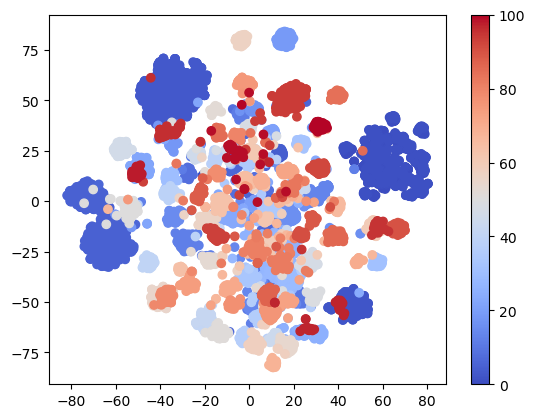

In [15]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

Now we write a helper function to plot images in 2D for t-SNE.

In [16]:
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from matplotlib.cbook import get_sample_data


def plot_images_in_2d(x, y, image_paths, axis=None, zoom=1):
    if axis is None:
        axis = plt.gca()
    x, y = np.atleast_1d(x, y)
    for x0, y0, image_path in zip(x, y, image_paths):
        image = Image.open(image_path)
        image.thumbnail((100, 100), Image.ANTIALIAS)
        img = OffsetImage(image, zoom=zoom)
        anno_box = AnnotationBbox(img, (x0, y0),
                                  xycoords='data',
                                  frameon=False)
        axis.add_artist(anno_box)
    axis.update_datalim(np.column_stack([x, y]))
    axis.autoscale()

In [17]:
def show_tsne(x, y, selected_filenames):
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x, y, selected_filenames, zoom=0.3, axis=axis)
    plt.show()

# Visualize the patterns in the images using t-SNE

/var/folders/x6/f9t0_d2d1v12tgmn5dhptygc0000gn/T/ipykernel_4689/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


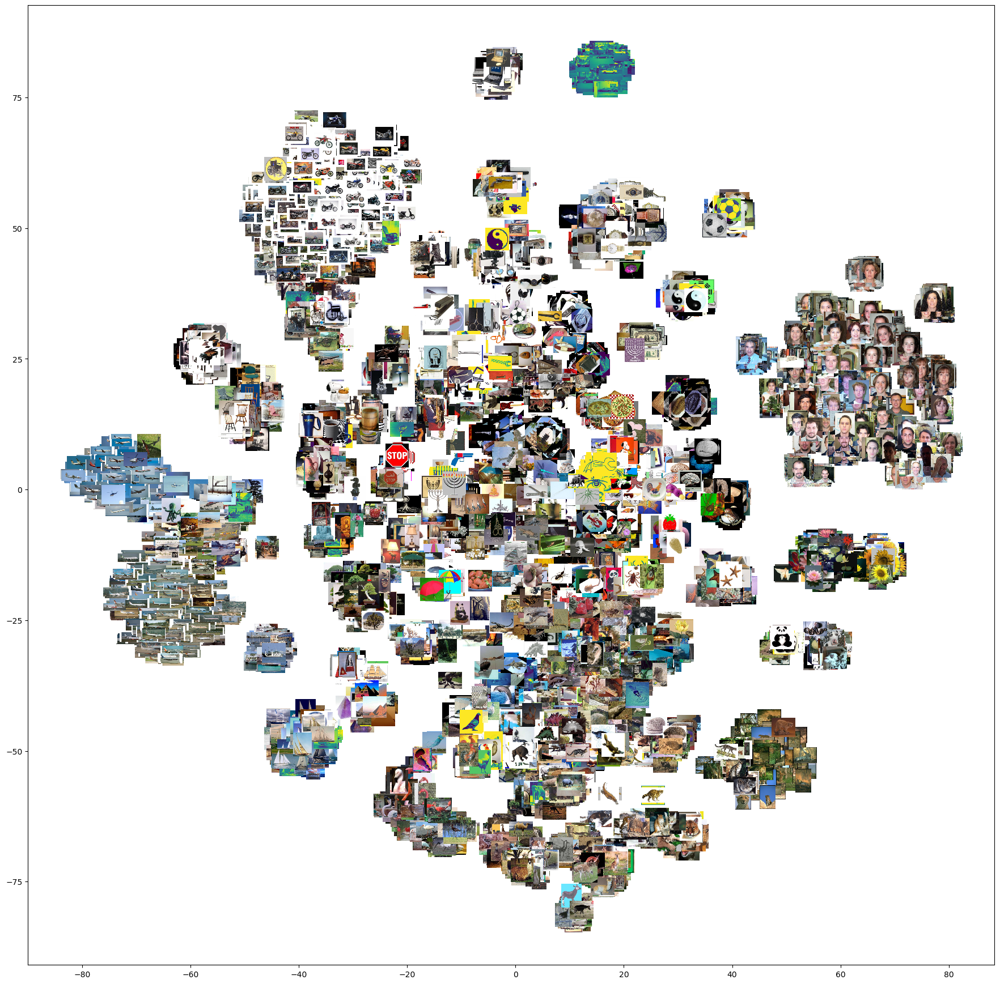

In [18]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

The show_tsne function piles images one on top of each other, making it harder to discern the patterns as the density of images is high. To help visualize the patterns better, we write another helper function tsne_to_grid_plotter_manual that spaces the images evenly.

In [19]:
def tsne_to_grid_plotter_manual(x, y, selected_filenames):
    S = 2000
    s = 100
    x = (x - min(x)) / (max(x) - min(x))
    y = (y - min(y)) / (max(y) - min(y))
    x_values = []
    y_values = []
    filename_plot = []
    x_y_dict = {}
    for i, image_path in enumerate(selected_filenames):
        a = np.ceil(x[i] * (S - s))
        b = np.ceil(y[i] * (S - s))
        a = int(a - np.mod(a, s))
        b = int(b - np.mod(b, s))
        if str(a) + "|" + str(b) in x_y_dict:
            continue
        x_y_dict[str(a) + "|" + str(b)] = 1
        x_values.append(a)
        y_values.append(b)
        filename_plot.append(image_path)
    fig, axis = plt.subplots()
    fig.set_size_inches(22, 22, forward=True)
    plot_images_in_2d(x_values, y_values, filename_plot, zoom=.58, axis=axis)
    plt.show()

/var/folders/x6/f9t0_d2d1v12tgmn5dhptygc0000gn/T/ipykernel_4689/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


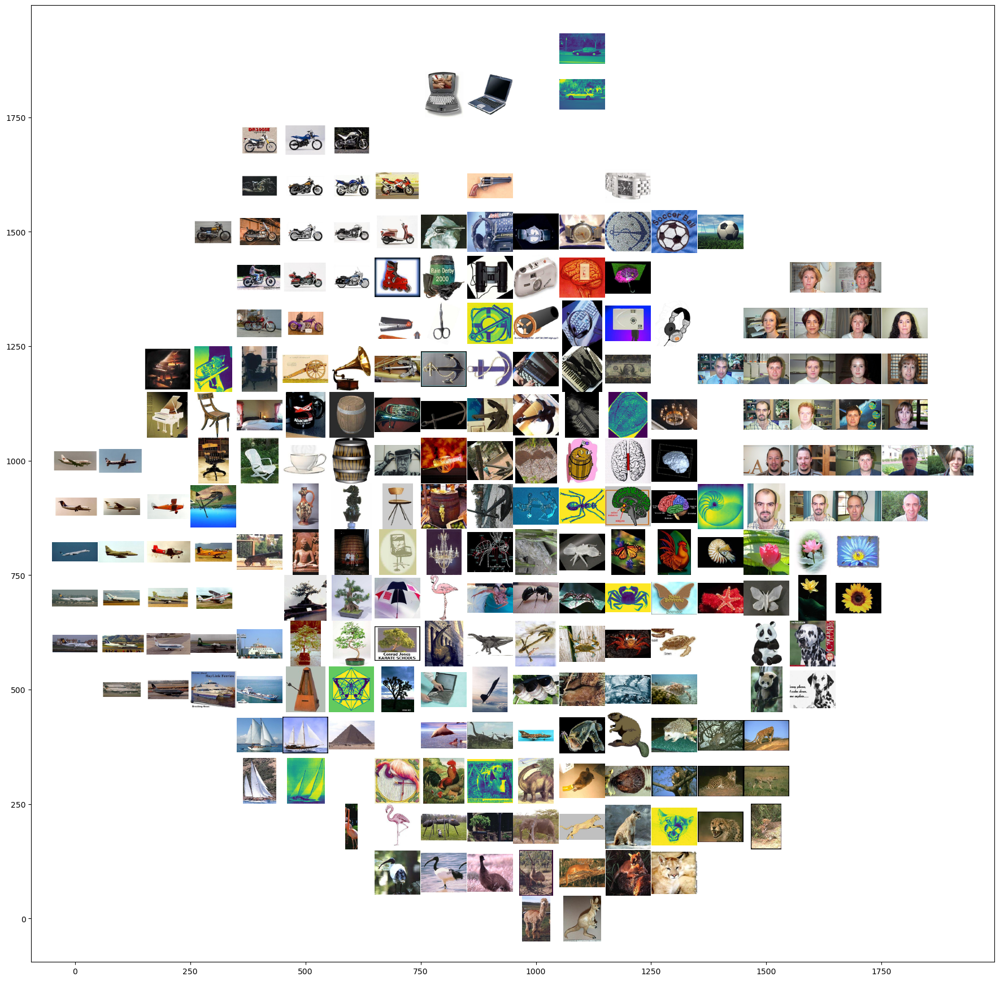

In [20]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

# PCA

We will perform Principal Component Analysis (PCA) over the features using 100 feature dimensions.

In [21]:
num_feature_dimensions = 100
pca = PCA(n_components=num_feature_dimensions)
pca.fit(feature_list)
feature_list_compressed = pca.transform(feature_list)

In [22]:
neighbors = NearestNeighbors(n_neighbors=5,
                             algorithm='brute',
                             metric='euclidean').fit(feature_list_compressed)
distances, indices = neighbors.kneighbors([feature_list_compressed[0]])

In [24]:
selected_features = feature_list_compressed[:4000]
selected_class_ids = class_ids[:4000]
selected_filenames = filenames[:4000]

time_start = time.time()
tsne_results = TSNE(n_components=2, verbose=1,
                    metric='euclidean').fit_transform(selected_features)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time() - time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 4000 samples in 0.000s...
[t-SNE] Computed neighbors for 4000 samples in 0.092s...
[t-SNE] Computed conditional probabilities for sample 1000 / 4000
[t-SNE] Computed conditional probabilities for sample 2000 / 4000
[t-SNE] Computed conditional probabilities for sample 3000 / 4000
[t-SNE] Computed conditional probabilities for sample 4000 / 4000
[t-SNE] Mean sigma: 0.143924
[t-SNE] KL divergence after 250 iterations with early exaggeration: 67.842438
[t-SNE] KL divergence after 1000 iterations: 1.122598
t-SNE done! Time elapsed: 6.373387098312378 seconds


# Plot a scatter plot from the generatod t-SNE results

/var/folders/x6/f9t0_d2d1v12tgmn5dhptygc0000gn/T/ipykernel_4689/1286269066.py:1: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('coolwarm')


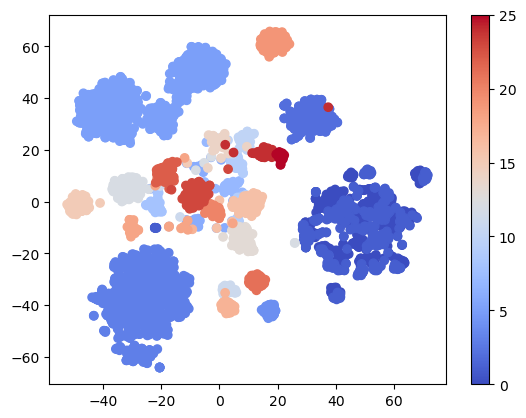

In [25]:
color_map = plt.cm.get_cmap('coolwarm')
scatter_plot = plt.scatter(tsne_results[:, 0],
                           tsne_results[:, 1],
                           c=selected_class_ids,
                           cmap=color_map)
plt.colorbar(scatter_plot)
plt.show()

# Visualize the patterns in the image using t-SNE

/var/folders/x6/f9t0_d2d1v12tgmn5dhptygc0000gn/T/ipykernel_4689/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


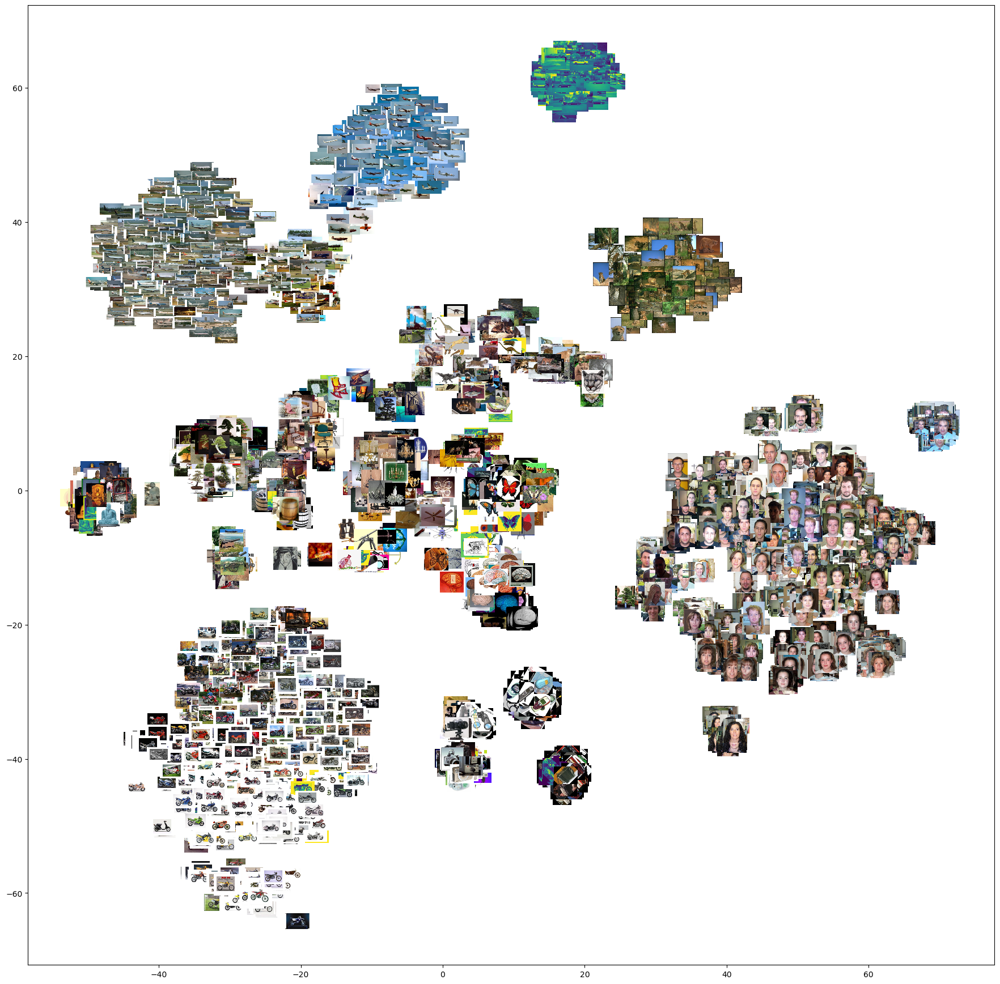

In [26]:
show_tsne(tsne_results[:, 0], tsne_results[:, 1], selected_filenames)

/var/folders/x6/f9t0_d2d1v12tgmn5dhptygc0000gn/T/ipykernel_4689/3270203280.py:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  image.thumbnail((100, 100), Image.ANTIALIAS)


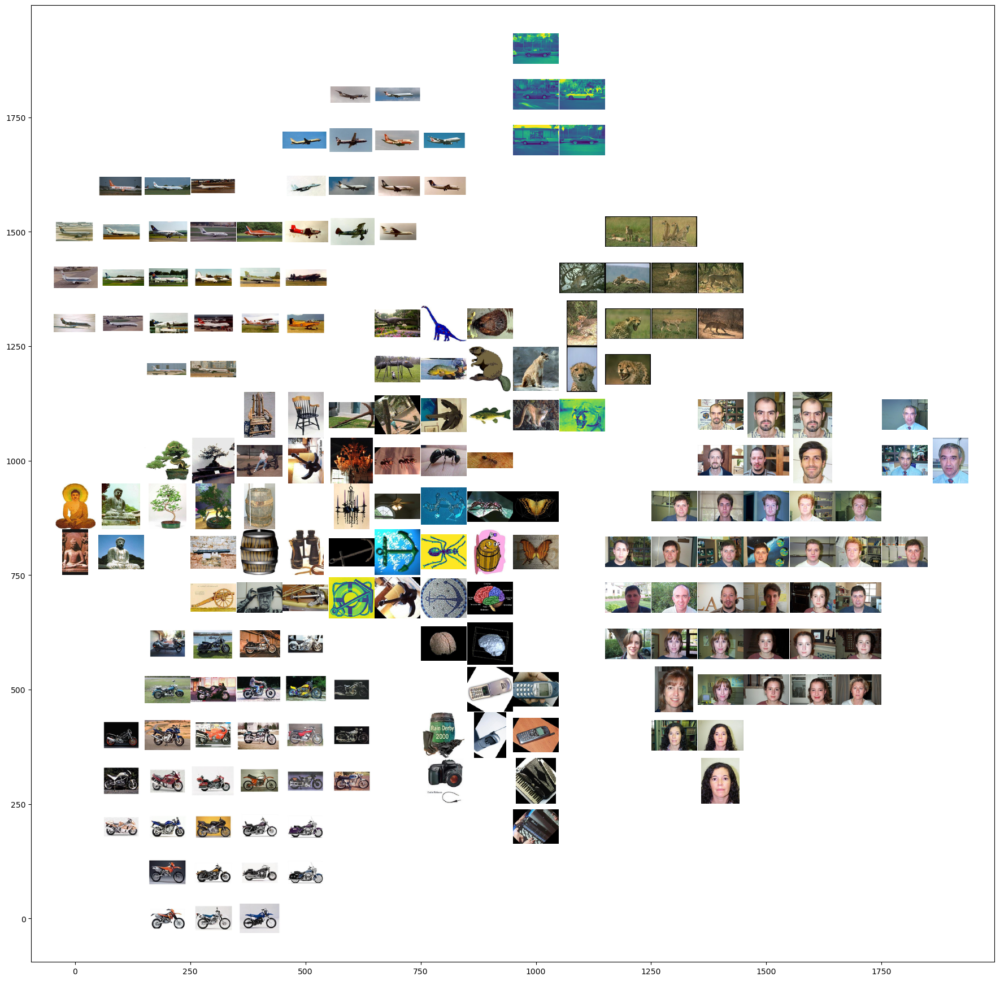

In [27]:
tsne_to_grid_plotter_manual(tsne_results[:, 0], tsne_results[:, 1],
                            selected_filenames)